In [1]:
from classes import *
from fonctions import *

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

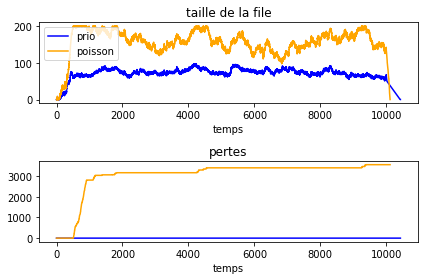

In [2]:
n = 10000

f1 = File(200, [Serveur_Priorite()], type_de_file = 'prio')
f2 = File(200, [Serveur(loi_temps=lambda p:np.random.poisson(p/10))], type_de_file = 'poisson')

A1 = poisson(n, 1, poids_poisson(10))
A2 = echelon(300,325, n = 1,distribution_poids = poids_deterministe(80))
A3 = echelon(400,425, n = 1,distribution_poids = poids_deterministe(80))

A = fusion_arrivees([A1, A2, A3])

trace_taille_pertes(f1, f2, A)

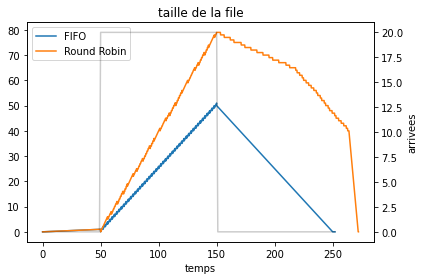

FIFO: 0 pertes (pondérées)
Round Robin: 0 pertes (pondérées)


In [3]:
A = echelon(50, 150, n=1, distribution_poids = poids_deterministe(20))

f1 = File(200, [Serveur()]*3, type_de_file = 'FIFO')
f2 = File(200, [Serveur_RR(1)]*3, type_de_file = 'Round Robin')

trace_taille_arrivees(f1, f2, A)

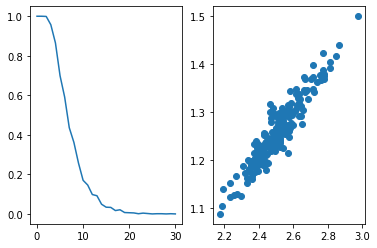

In [9]:
fig, axs = plt.subplots(1,2)

n = 100
m = 10

graph = []

for K in range(31):
    pertes = []
    for i in range(1000):
        f = File(K, [Serveur()])
        A = poisson(n, 0.9, distribution_poids=poids_deterministe(10))
        f.simul(A)
        pertes.append(f.pertes>0)
    graph.append(np.average(pertes))

axs[0].plot(graph)

f = File(200, [Serveur(loi_temps = lambda p:np.random.poisson(p))])

n = 10000


temps_attente_moyen = []

taille_moyenne = []

for i in range(200):
    A = poisson(n, 0.5, lambda:np.random.poisson(1))
    f.reset()
    N= f.simul_taille(A)
    _,N = lire_evenements(N)
    taille_moyenne.append(np.average(N))
    temps_attente_moyen.append(np.average(f.temps_attente))

axs[1].scatter(temps_attente_moyen, taille_moyenne)

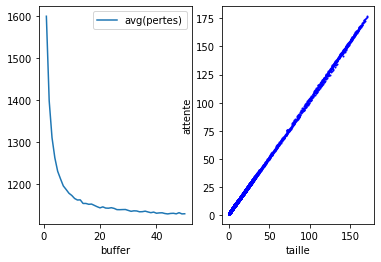

In [10]:
fig, axs = plt.subplots(1,2)

con = sqlite3.connect('Simulations.db')

df = pd.read_sql('SELECT buffer, avg(pertes) FROM Data JOIN Files ON file_id = Files.id WHERE buffer < 200 GROUP BY buffer;', con=con)

df.plot(x=0, y=1, ax = axs[0])

df = pd.read_sql('''SELECT taille, attente FROM Data JOIN Files ON file_id = Files.id JOIN Arrivees on Data.arrivees_id = Arrivees.id JOIN Serveurs ON Serveurs.id = serveur_id WHERE lambda = 1 AND arrivees_id < 19''', con=con)

df.plot.scatter(x=0, y=1, s=1, color='blue', ax = axs[1])

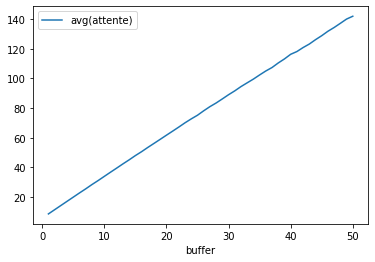

In [11]:
con = sqlite3.connect('Simulations.db')

df = pd.read_sql('SELECT buffer, avg(attente) FROM Data JOIN Files ON file_id = Files.id WHERE buffer < 200 GROUP BY buffer;', con=con)

df.plot(x=0, y=1)

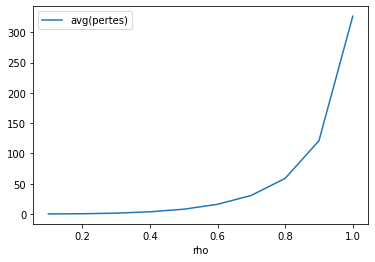

In [12]:
con = sqlite3.connect('Simulations.db')

df = pd.read_sql('SELECT rho, avg(pertes) FROM Data GROUP BY rho;', con=con)

df.plot(x=0, y=1)

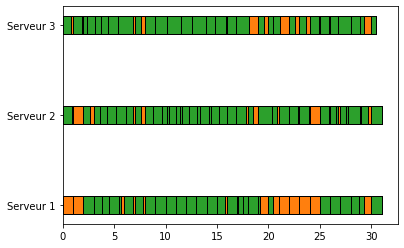

In [14]:
n = 30

f1 = File(200, [Serveur_RR(1), Serveur_Priorite(), Serveur()], type_de_file = 'deterministe')
A1 = poisson(n, 3, poids_poisson(9))

f1.simul(A1)

labels = ['Serveur 1', 'Serveur 2', 'Serveur 3']
fig, ax = plt.subplots()
f1.temps_travail.reverse()

for el in f1.temps_travail:
    ax.barh(labels, el[0], height=0.2, color = el[1], edgecolor = 'black')

plt.show()